In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
wider_19p0 = np.load('Run_040118/bolp_19p0_um_0_wider.npz')

In [3]:
wider_19p0.files

['i', 'func_all', 'param']

In [4]:
Npert = 5000

In [5]:
p0_19p0 = np.array((1.04029,12.80315,0.51193,10.25010,11.64354,0.,0.))
dp_range = np.array((0.11,0.4,0.225,0.9,0.2,1.,1.))

In [14]:
def fit_cutout_derivative(param,func,p0,f0,ip,jf,n,plot=0):
    p_75 = np.percentile(param,75)
    p_25 = np.percentile(param,25)
    mask = np.logical_or(param>p_75,param<p_25)
    a,b = np.polyfit(np.concatenate((np.zeros(1)+p0,param[mask])),np.concatenate((np.zeros(1)+f0,func[mask])),1,\
                     w=np.concatenate((np.zeros(1)+100,0.*param[mask]+1)))
    if plot:
        plt.figure()
        plt.plot(param[mask],func[mask],'b.',alpha=0.1)
        plt.plot(p0,f0,'bo')
        prange = np.linspace(min(param),max(param),100)
        plt.plot(prange,a*prange+b,'r-')
        plt.axvline(p0,linestyle=':',color='grey')
        plt.title(a)
        plt.savefig(str('Run_040118/bolp19p0_cutout_fix0_test'+'/p{}f{}_{}').format(ip,jf,n))
        plt.close()
    return a

In [7]:
cutout_deriv = np.zeros((7,160,100))

In [9]:
fid_19p0 = np.load('Run_040118/bolp_19p0_0.npz')

In [11]:
for i in range(7):
    param = wider_19p0['param'][i*Npert:i*Npert+Npert,i]
    func = wider_19p0['func_all'][i*Npert:i*Npert+Npert]
    p0 = p0_19p0[i]
    for j in range(160):
        print j
        funcj = func[:,j]
        for n in range(100):
            idx = np.random.choice(5000,(50+50*n),replace=0)
            cutout_deriv[i,j,n] = fit_cutout_derivative(param[idx],funcj[idx],p0,np.mean(fid_19p0['func_all'][:,j]),i,j,n)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144


In [15]:
for i in range(7):
    for j in range(160):
        plt.figure()
        plt.plot(np.arange(1,101)*50,cutout_deriv[i,j]/cutout_deriv[i,j,-1])
        plt.axhline(1,linestyle=':',color='grey')
        plt.ylim((0,2))
        plt.savefig(str('Run_040118/bolp19p0_cutout_fix0_test'+'/p{}f{}').format(i,j))
        plt.close()

In [17]:
for i in range(7):
    param = wider_19p0['param'][i*Npert:i*Npert+Npert,i]
    func = wider_19p0['func_all'][i*Npert:i*Npert+Npert]
    p0 = p0_19p0[i]
    for j in range(160):
        funcj = func[:,j]
        fit_cutout_derivative(param,funcj,p0,np.mean(fid_19p0['func_all'][:,j]),i,j,'all',plot=1)

In [25]:
param_names = ('alpha','logM1','sigma_logM','logM0','logMmin','mean_occupation_centrals_assembias_param1','mean_occupation_satellites_assembias_param1')

In [18]:
def calc_cov(covjk,func_real):
    return np.mean(covjk,axis=0)+np.cov(func_real.T)

In [19]:
def calc_fisher(dfdp, covtot):
    fmatrix = np.zeros((7,7))
    for i in range(7):
        for j in range(7):
            fmatrix[i,j] = np.dot(dfdp[i],np.dot(np.linalg.inv(covtot),dfdp[j]))
    return fmatrix

In [20]:
def calc_1sigma(fisher):
    return np.sqrt(np.linalg.inv(fisher).diagonal())

In [21]:
cutout_deriv[5,0,:] = 0

cutout_deriv[6,0,:] = 0

In [22]:
calc_1sigma(calc_fisher(cutout_deriv[:,:,-1],calc_cov(fid_19p0['func_all_cov'],fid_19p0['func_all'])))

array([ 0.01186726,  0.014494  ,  0.0400275 ,  1.19123817,  0.02607645,
        0.11554856,  0.13830995])

In [23]:
one_sigma = np.zeros((50,7))
cov = calc_cov(fid_19p0['func_all_cov'],fid_19p0['func_all'])
for i in range(50):
    print i
    one_sigma[i] = calc_1sigma(calc_fisher(cutout_deriv[:,:,i*2+1],cov))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


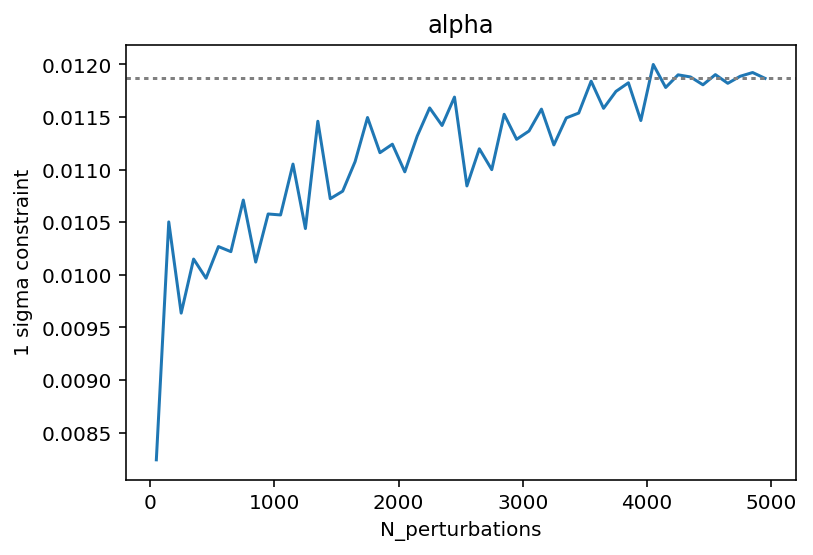

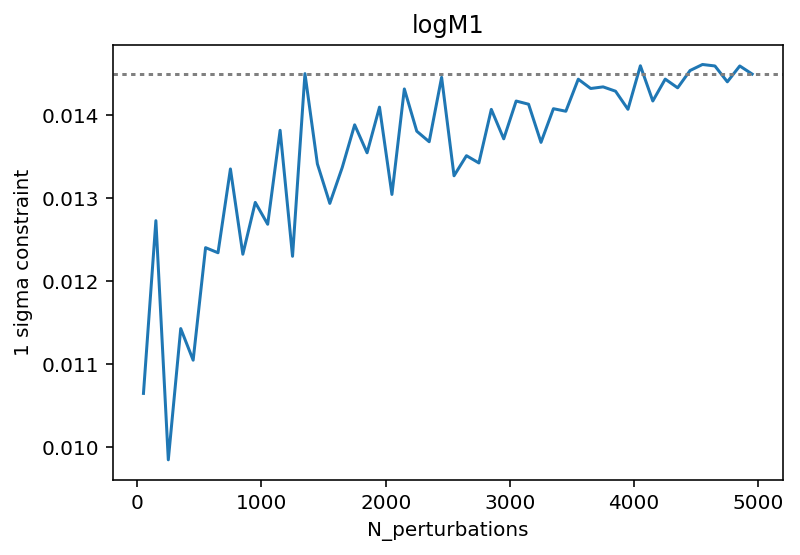

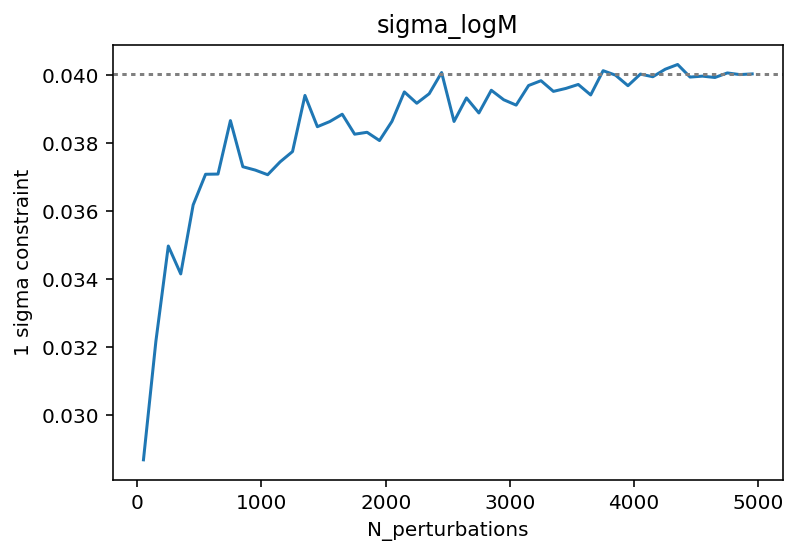

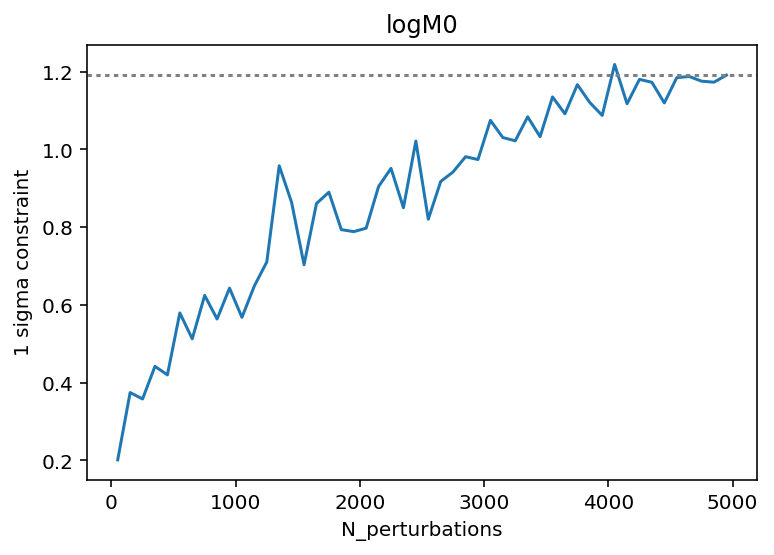

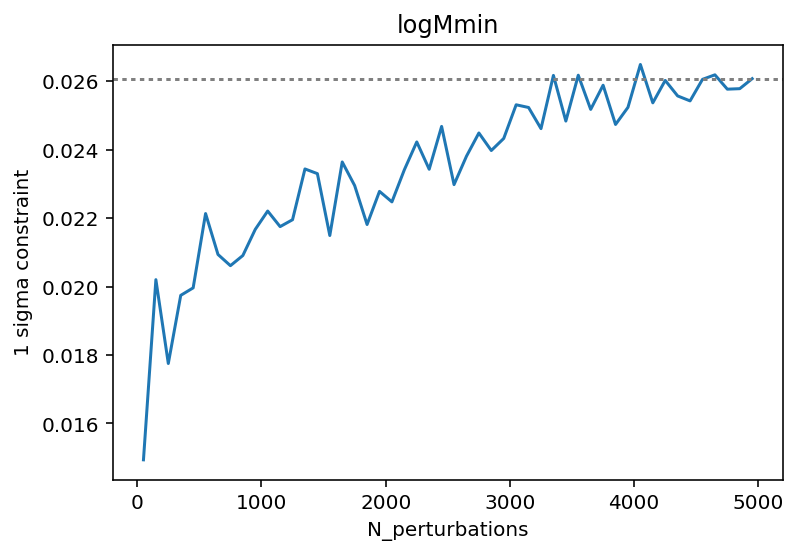

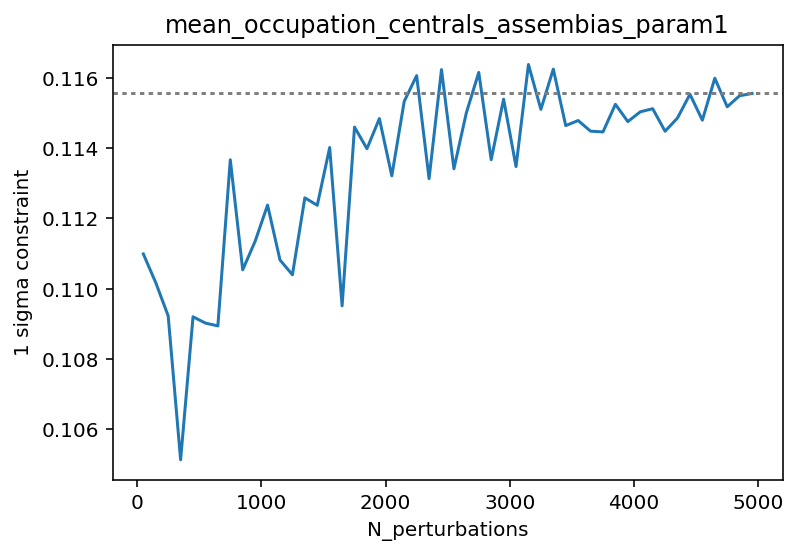

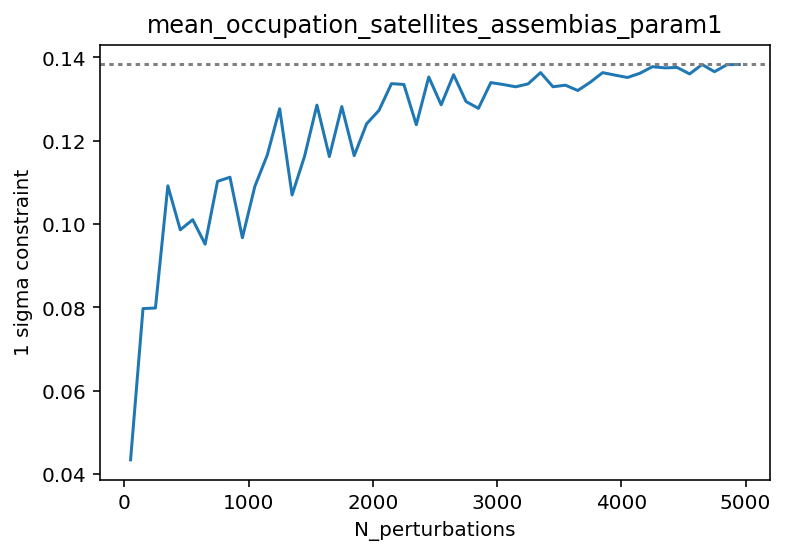

In [26]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma[:,i])
    plt.axhline(one_sigma[-1,i],linestyle=':',color='grey')

In [27]:
def calc_1sigma_prior(fisher,prior_i,prior_inv_s2):
    fisher[prior_i,prior_i] += prior_inv_s2
    return np.sqrt(np.linalg.inv(fisher).diagonal())

In [28]:
one_sigma_pp = np.zeros((50,7))
for i in range(50):
    print i
    one_sigma_pp[i] = calc_1sigma_prior(calc_fisher(cutout_deriv[:,:,i*2+1],cov),3,100)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


In [62]:
calc_fisher(cutout_deriv[:,:,i*2+1],cov)[3,3]

34.987539294558523

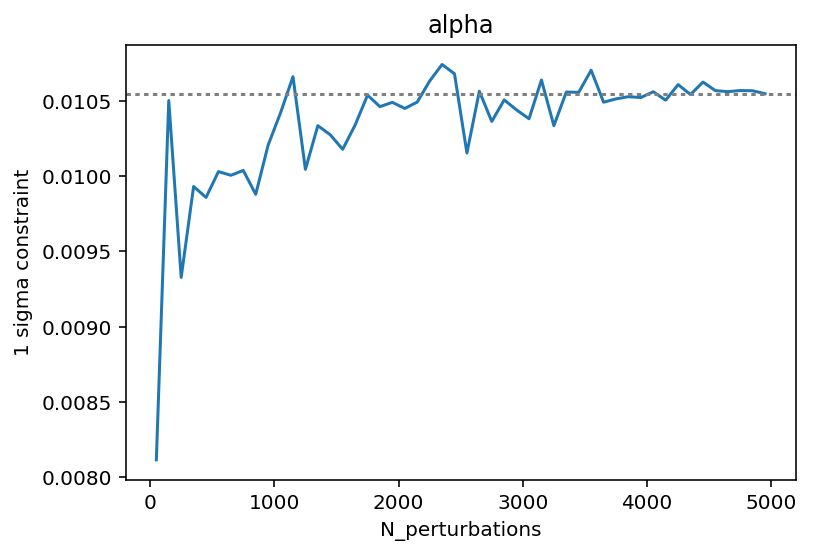

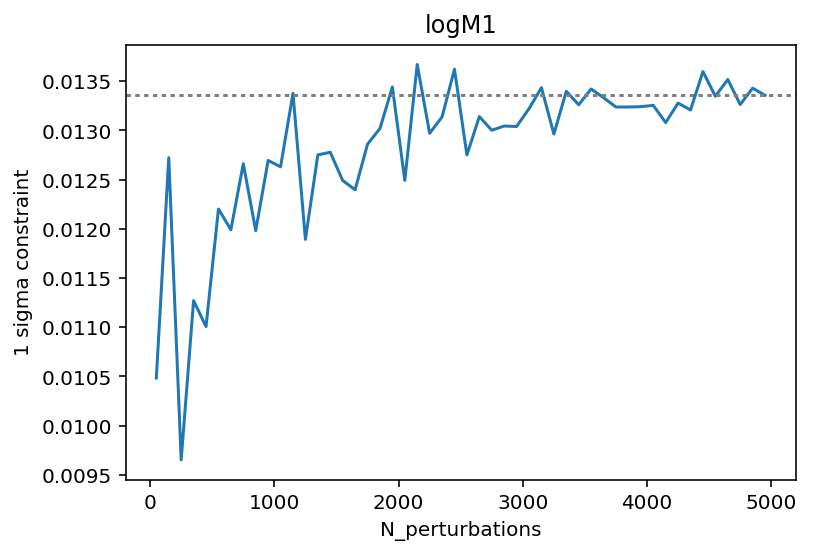

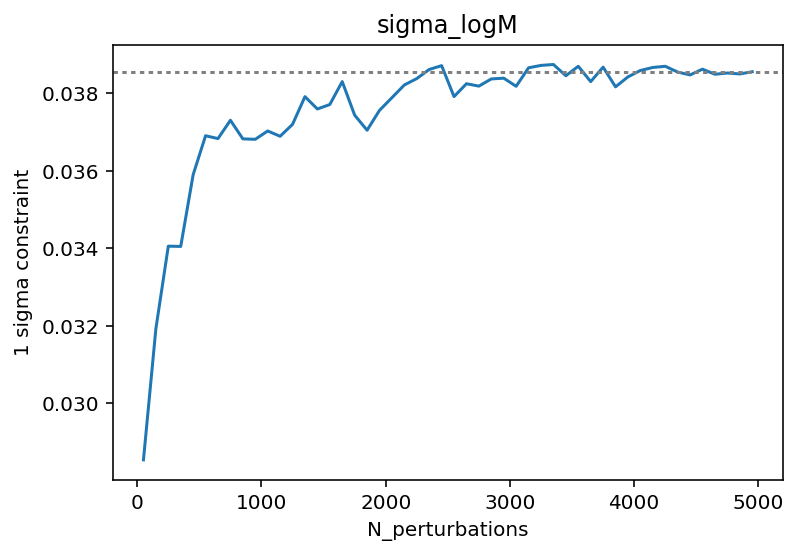

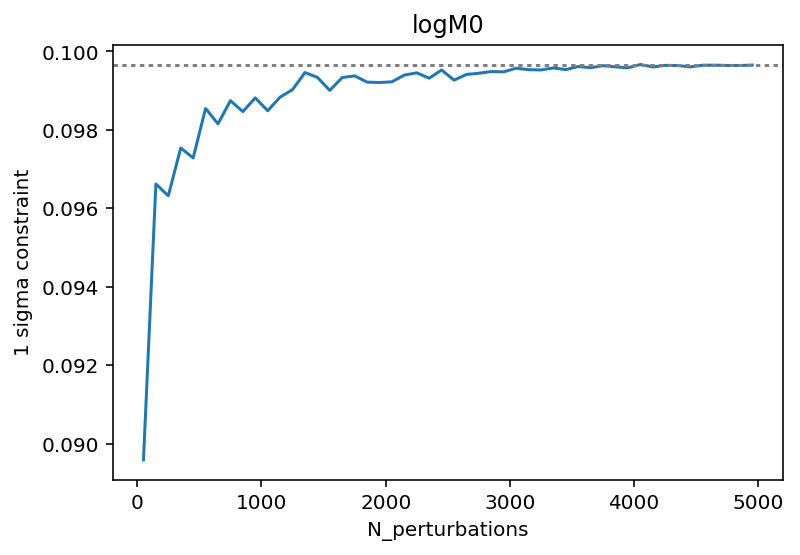

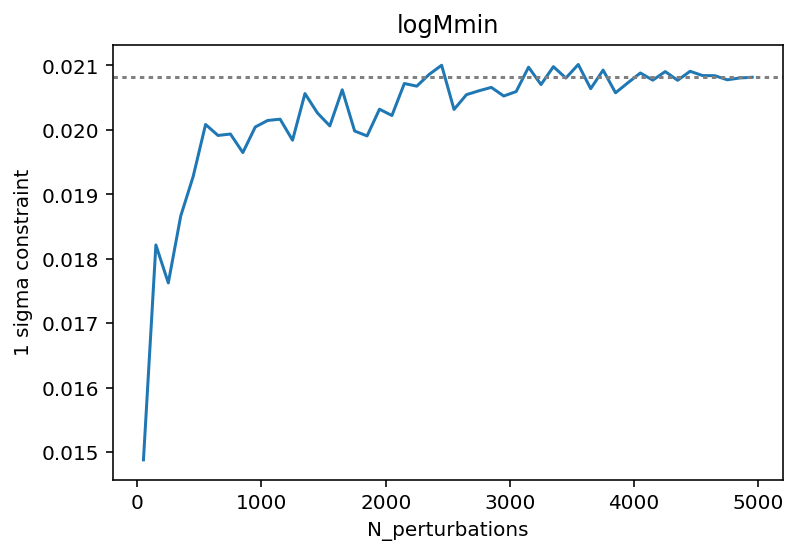

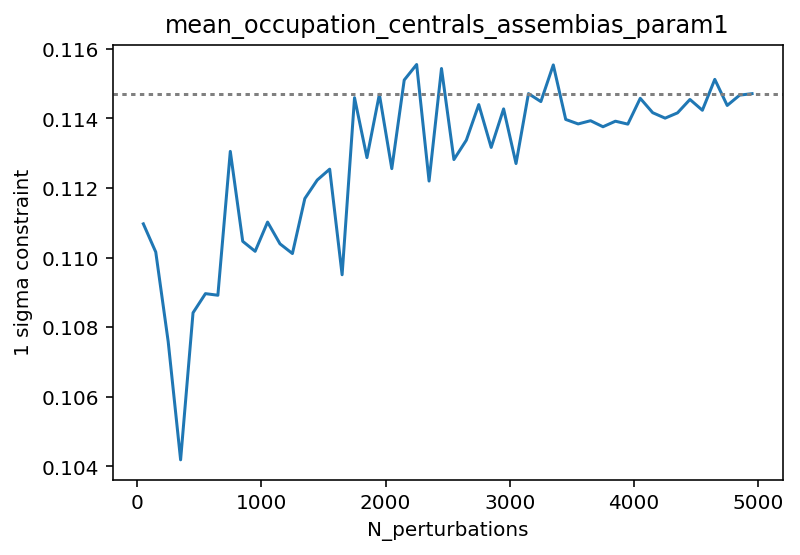

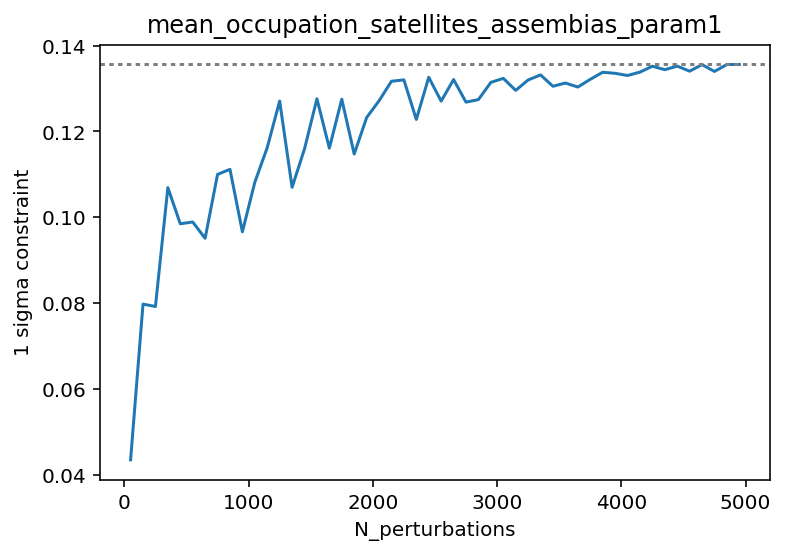

In [29]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma_pp[:,i])
    plt.axhline(one_sigma_pp[-1,i],linestyle=':',color='grey')

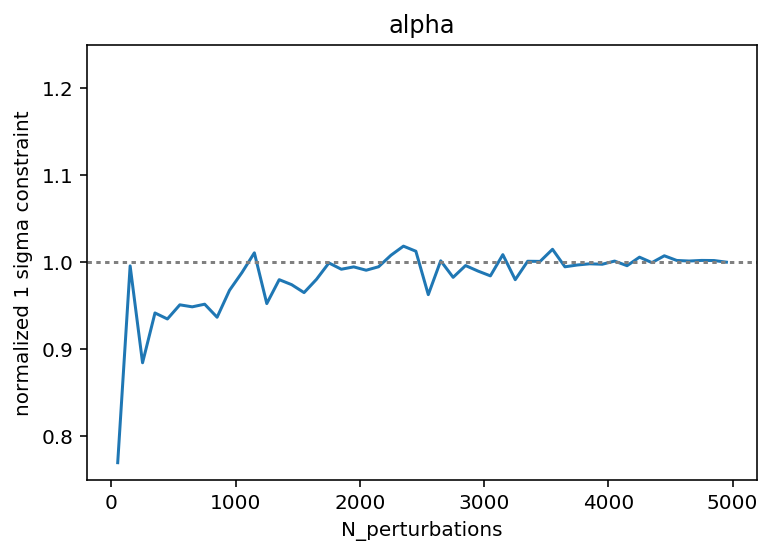

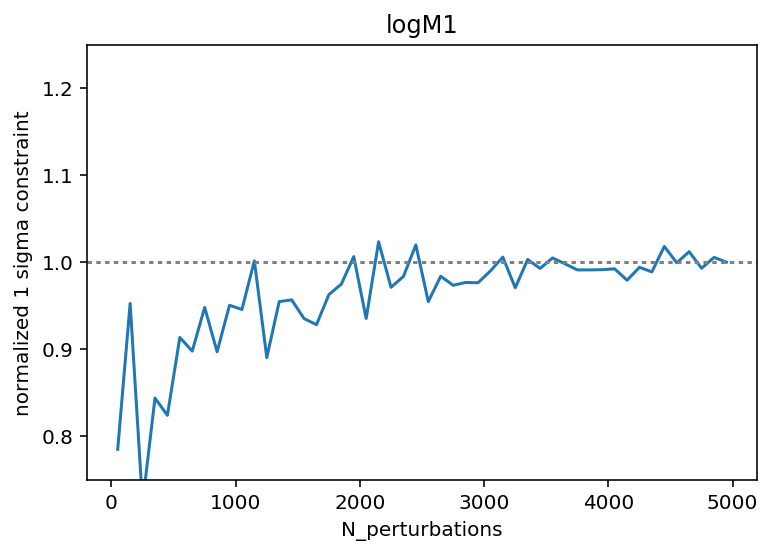

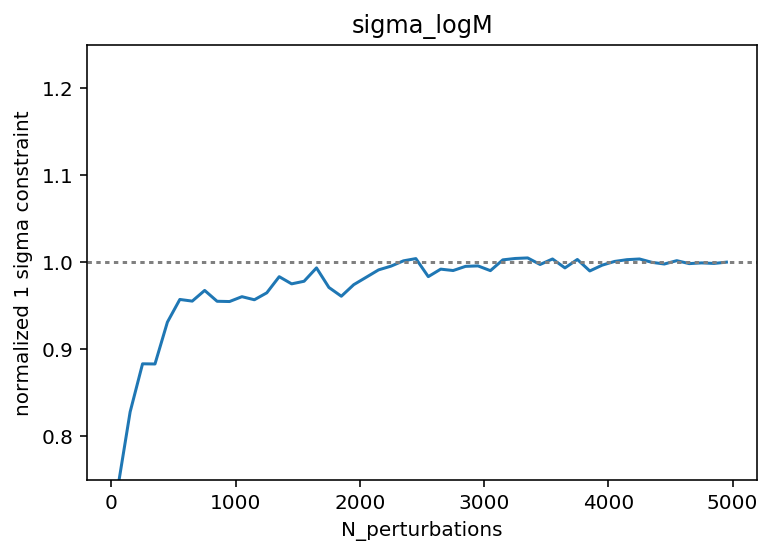

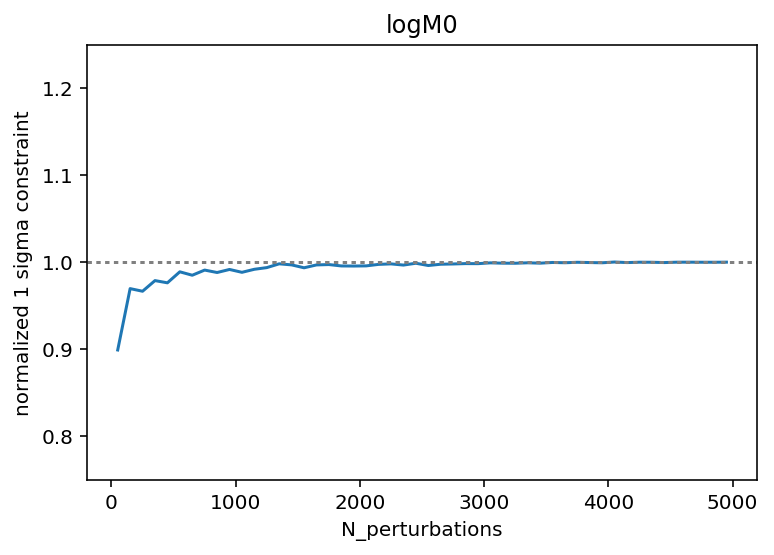

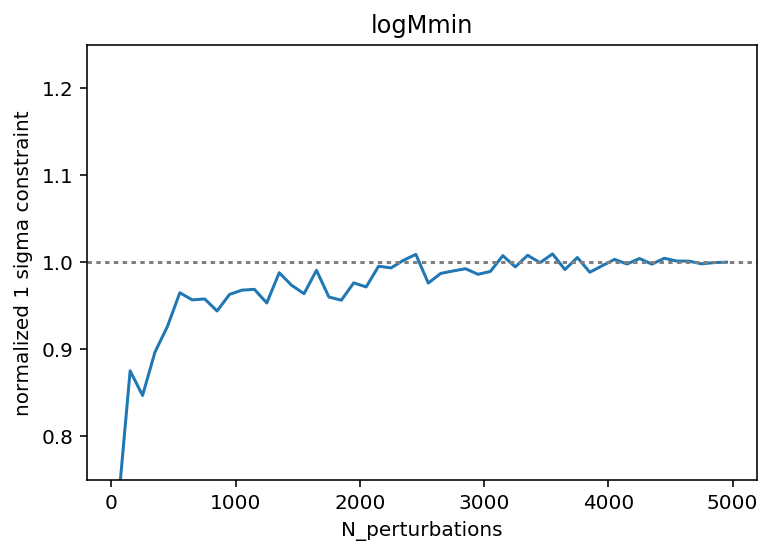

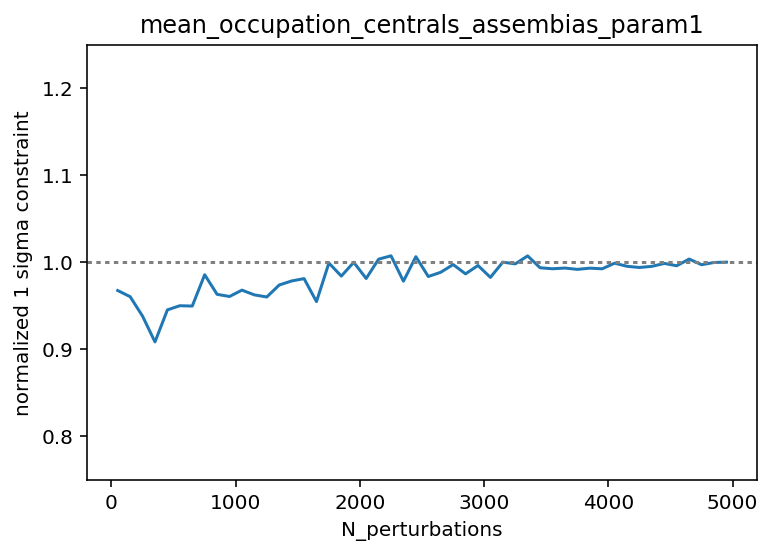

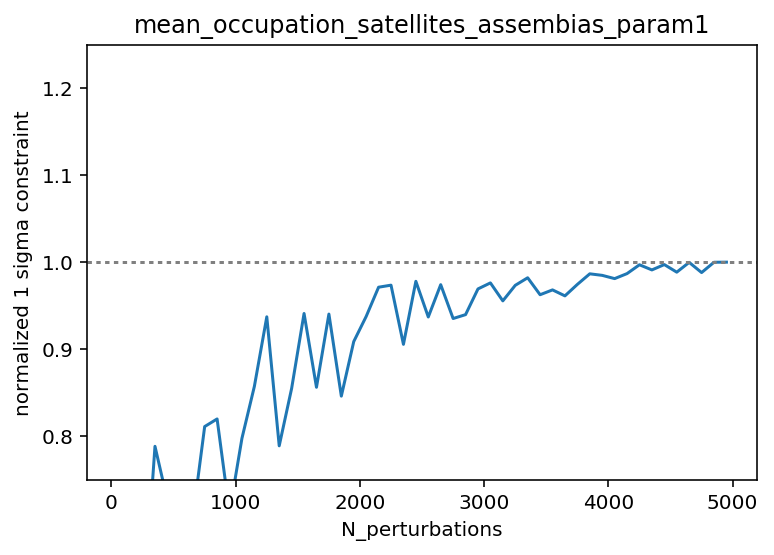

In [30]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('normalized 1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma_pp[:,i]/one_sigma_pp[-1,i])
    plt.axhline(1,linestyle=':',color='grey')
    plt.ylim((0.75,1.25))

In [31]:
one_sigma_pp_wp = np.zeros((50,7))
for i in range(50):
    print i
    one_sigma_pp_wp[i] = calc_1sigma_prior(calc_fisher(cutout_deriv[:,:30,i*2+1],cov[:30,:30]),3,100)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


In [64]:
eigval_pp_wp = np.zeros((50,7))
for i in range(50):
    print i
    eigval_pp_wp[i] = np.linalg.eigvals(calc_fisher(cutout_deriv[:,:30,i*2+1],cov[:30,:30]))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


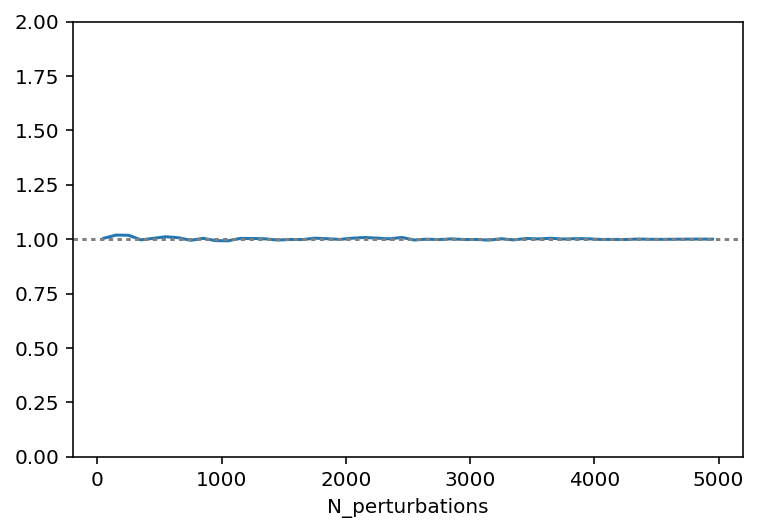

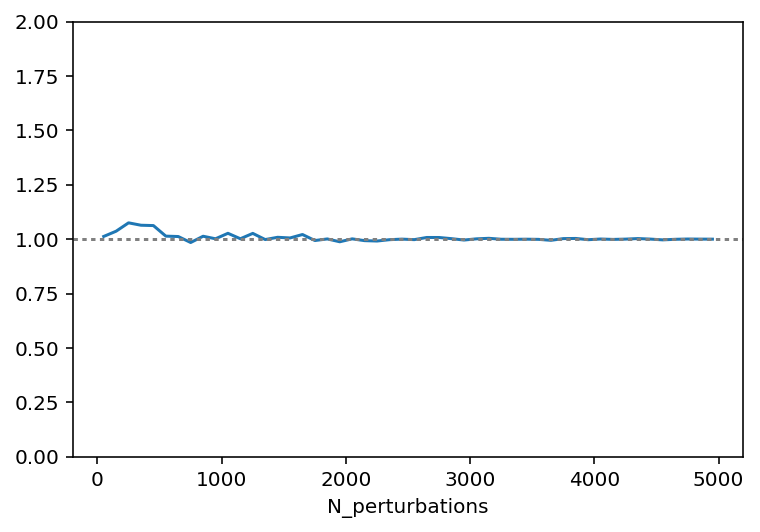

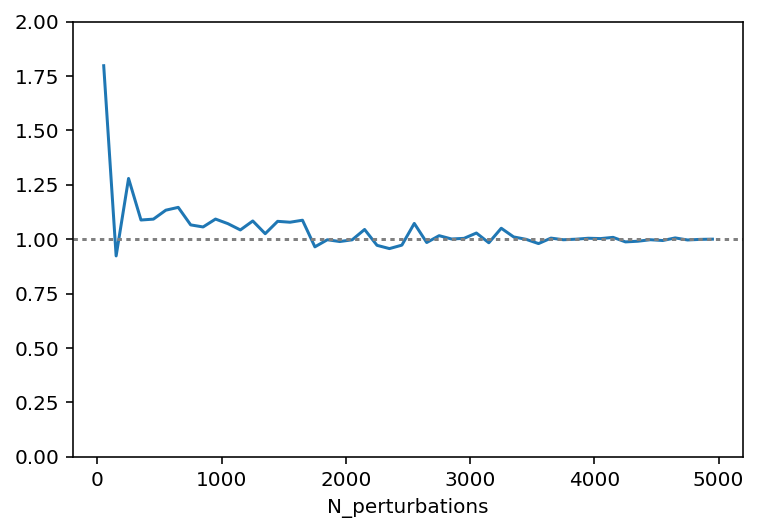

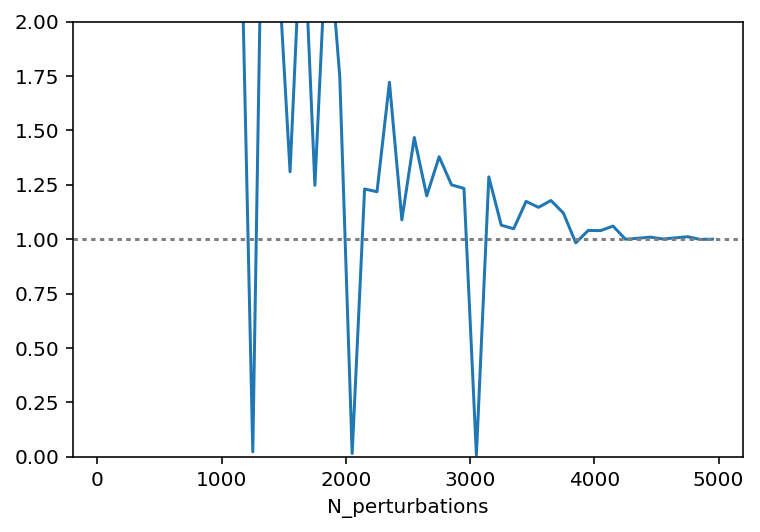

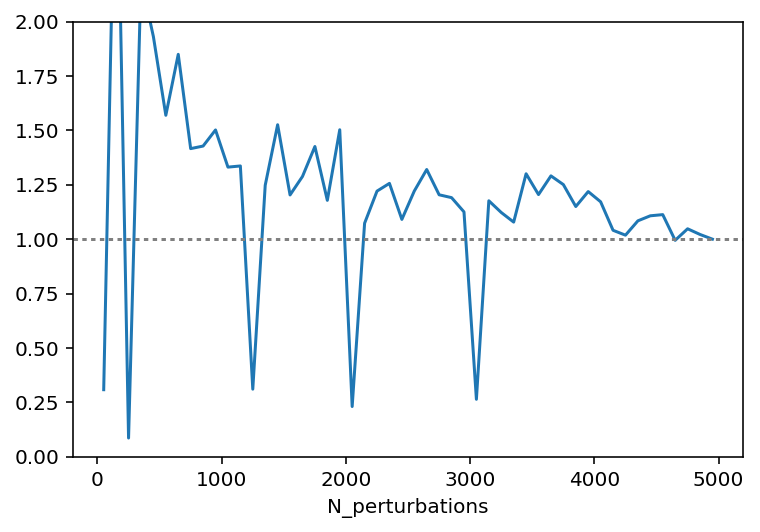

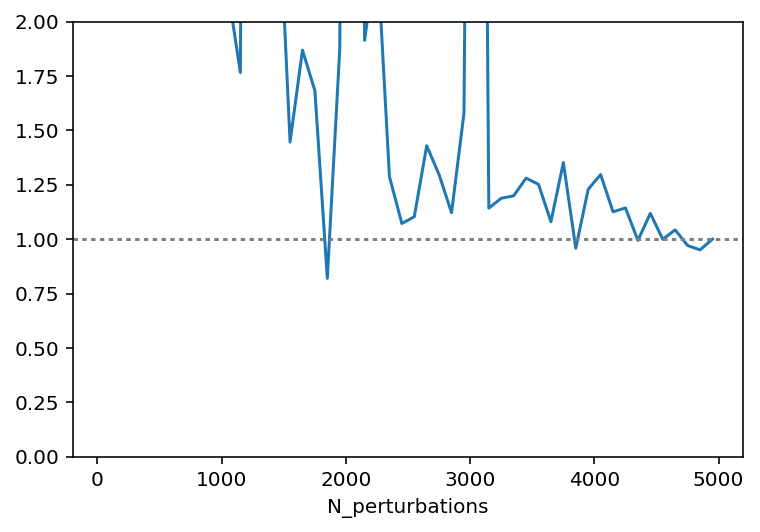

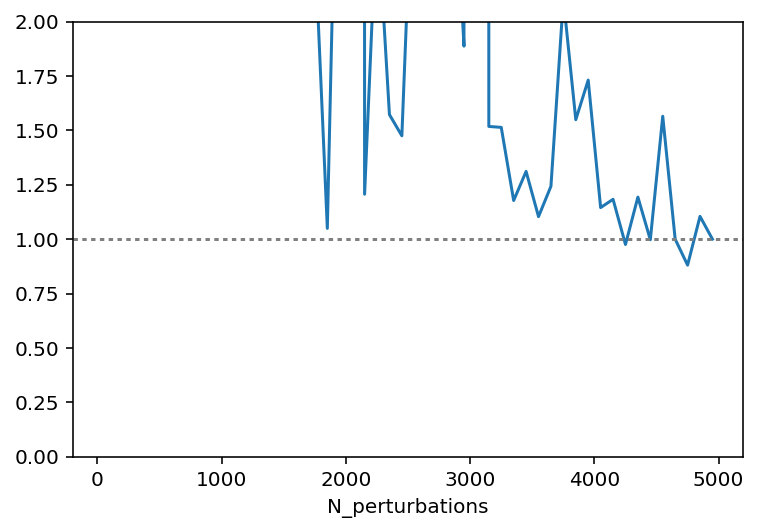

In [69]:
for i in range(7):
    plt.figure()
    #plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    #plt.ylabel('normalized 1 sigma constraint')
    plt.plot(np.arange(50)*100+50,eigval_pp_wp[:,i]/eigval_pp_wp[-1,i])
    plt.axhline(1,linestyle=':',color='grey')
    plt.ylim((0,2))

In [63]:
calc_fisher(cutout_deriv[:,:30,i*2+1],cov[:30,:30])[3,3]

6.6186489529759678

In [32]:
one_sigma_pp_wp[-1]

array([ 0.03578804,  0.04703395,  0.64993156,  0.09997739,  0.30953167,
        0.60413579,  0.35435879])

/home/kuw8/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in divide
  app.launch_new_instance()


(-0.5, 2.5)

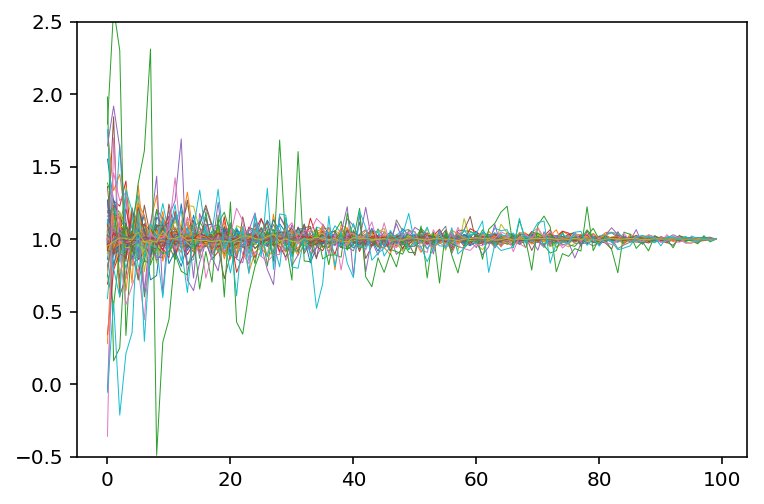

In [55]:
for i in range(30):
    for j in range(7):
        plt.plot(cutout_deriv[j,i,np.arange(100)]/cutout_deriv[j,i,-1],lw=0.5)
plt.ylim((-0.5,2.5))

(-0.5, 2.5)

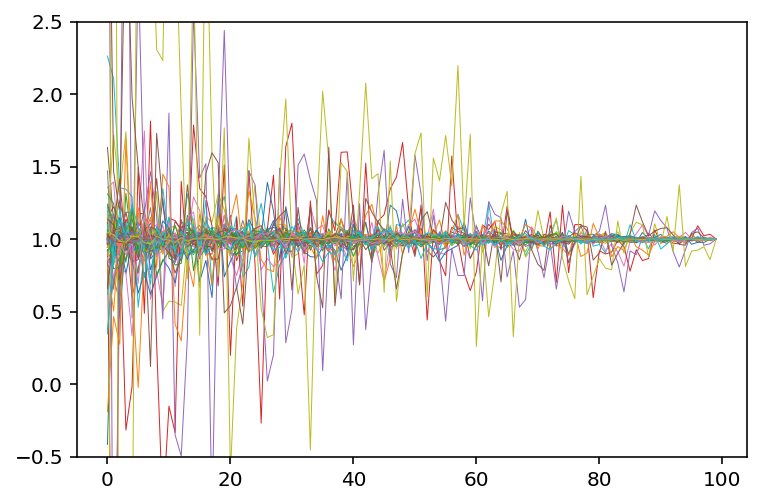

In [56]:
for i in range(30):
    for j in range(7):
        plt.plot(cutout_deriv[j,i+30,np.arange(100)]/cutout_deriv[j,i+30,-1],lw=0.5)
plt.ylim((-0.5,2.5))

(-0.5, 2.5)

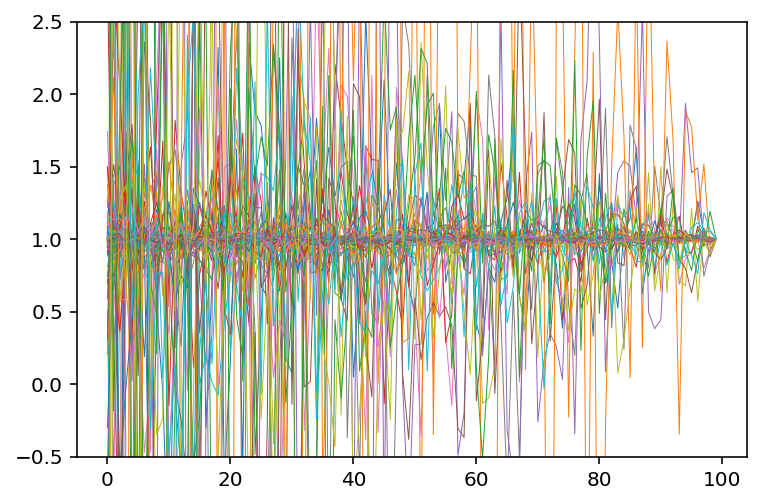

In [57]:
for i in range(30):
    for j in range(7):
        plt.plot(cutout_deriv[j,i+60,np.arange(100)]/cutout_deriv[j,i+60,-1],lw=0.5)
plt.ylim((-0.5,2.5))

(-0.5, 2.5)

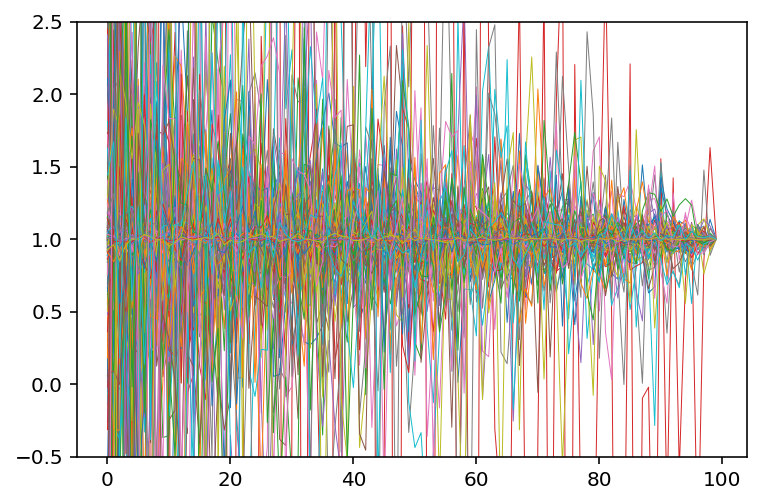

In [58]:
for i in range(70):
    for j in range(7):
        plt.plot(cutout_deriv[j,i+90,np.arange(100)]/cutout_deriv[j,i+90,-1],lw=0.5)
plt.ylim((-0.5,2.5))

## wp only

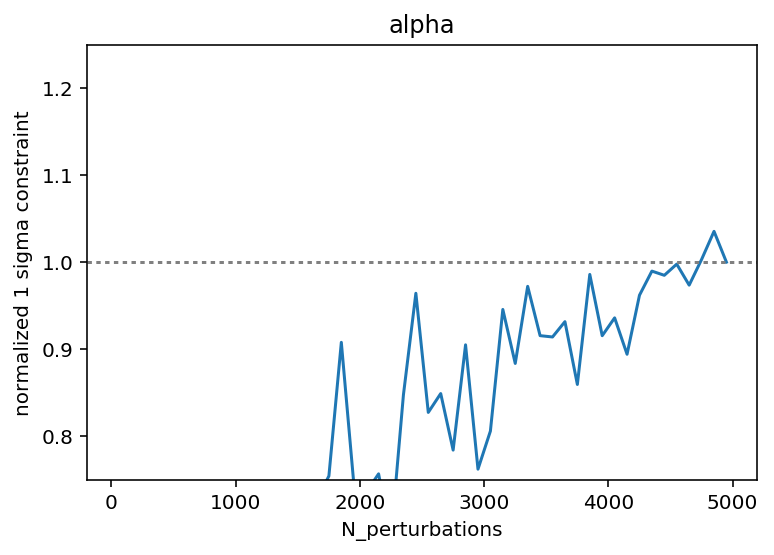

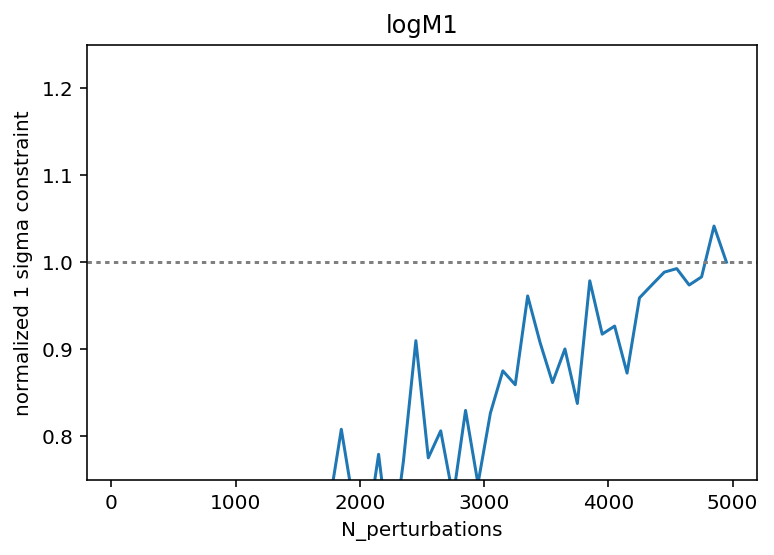

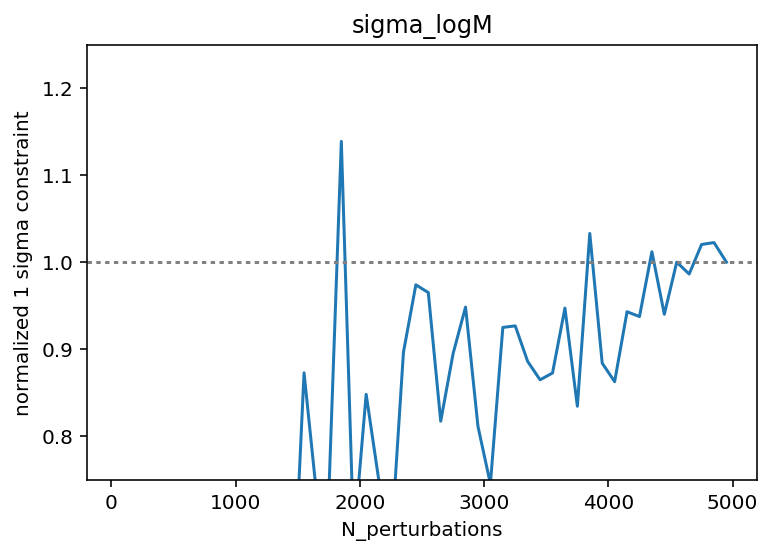

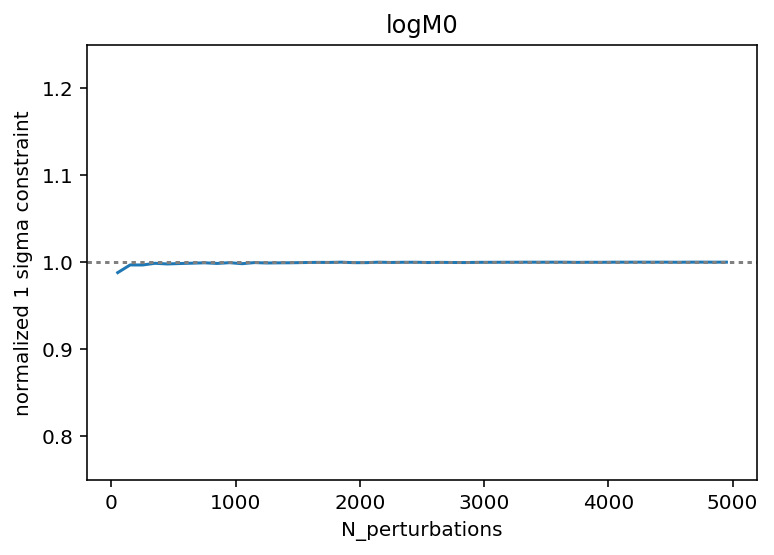

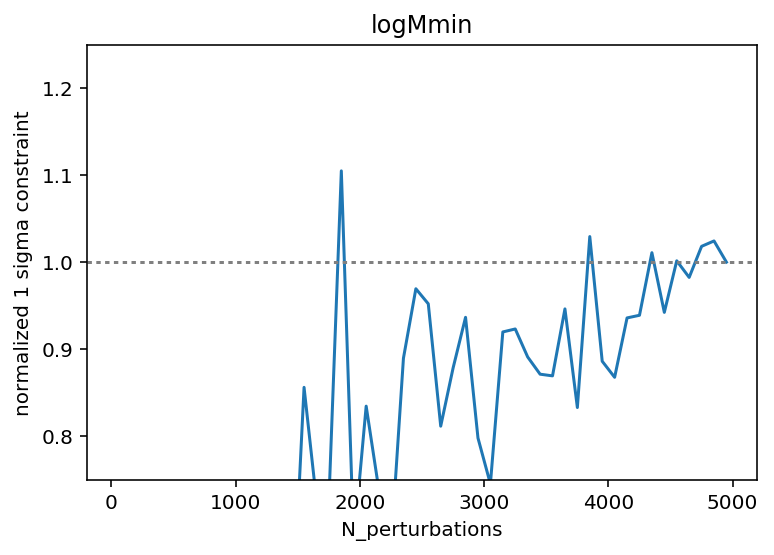

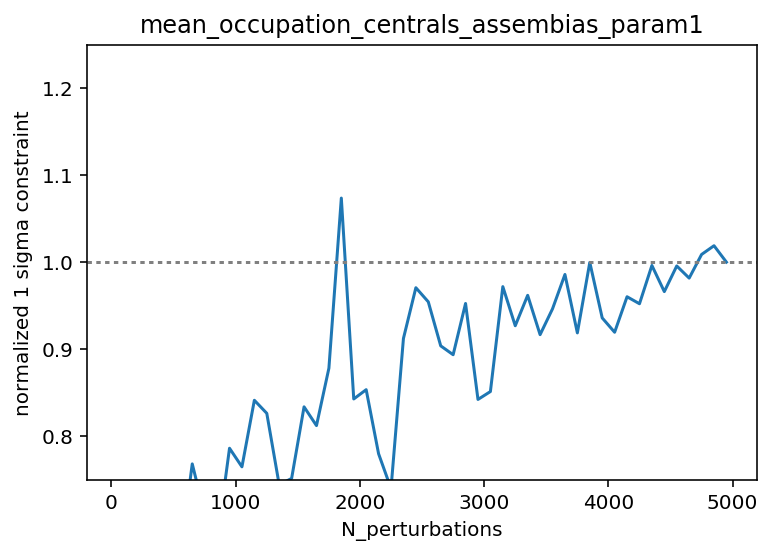

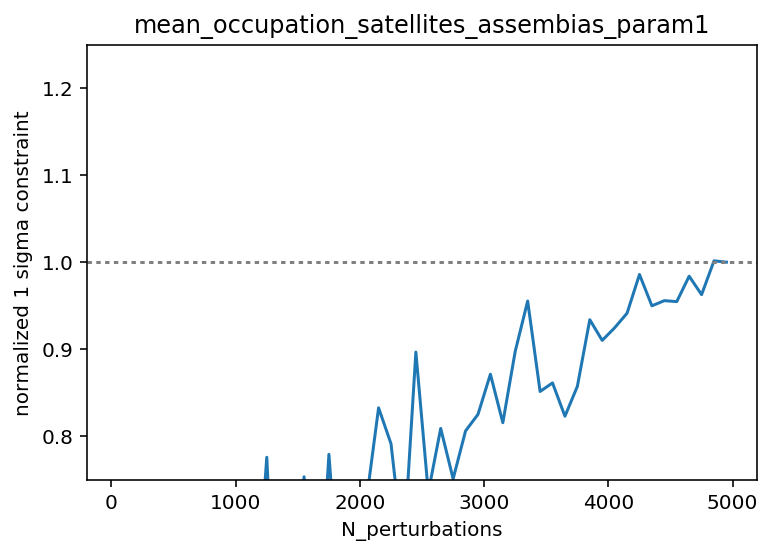

In [61]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('normalized 1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma_pp_wp[:,i]/one_sigma_pp_wp[-1,i])
    plt.axhline(1,linestyle=':',color='grey')
    plt.ylim((0.75,1.25))

In [34]:
one_sigma_pp_ds = np.zeros((50,7))
for i in range(50):
    print i
    one_sigma_pp_ds[i] = calc_1sigma_prior(calc_fisher(cutout_deriv[:,30:60,i*2+1],cov[30:60,30:60]),3,100)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


## delta sigma only

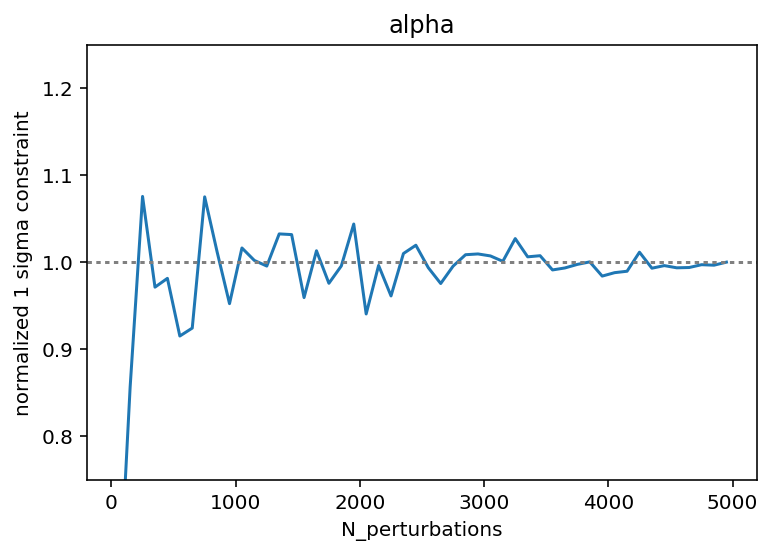

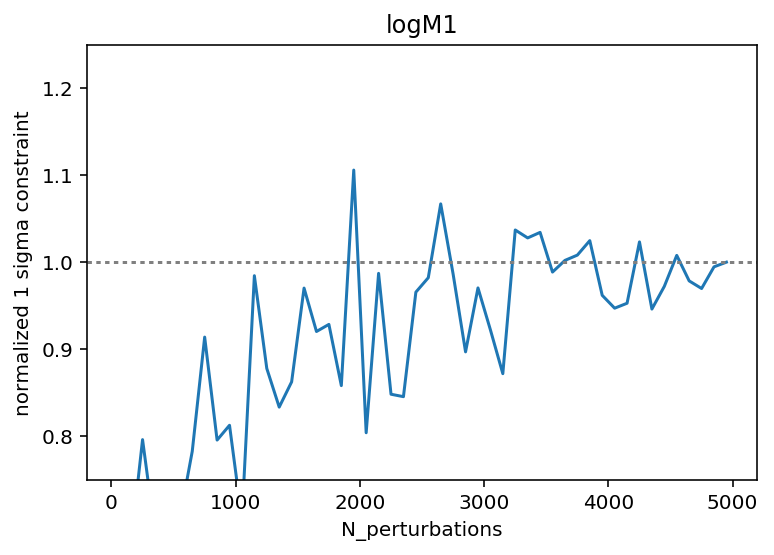

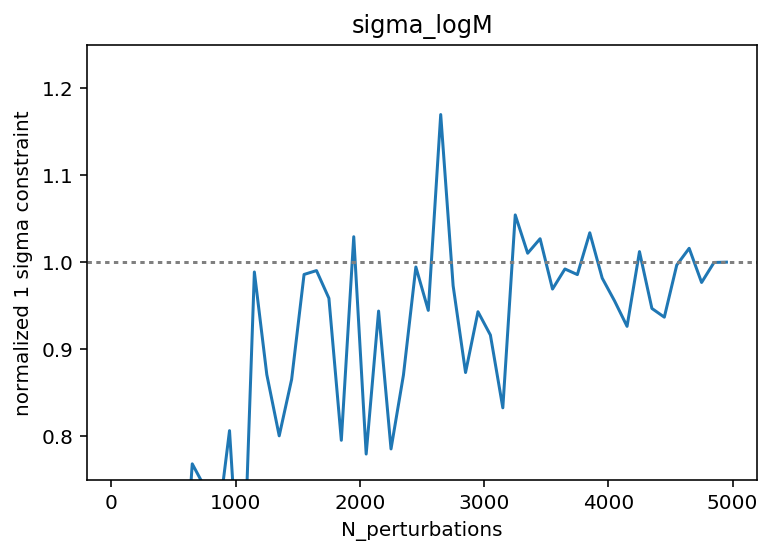

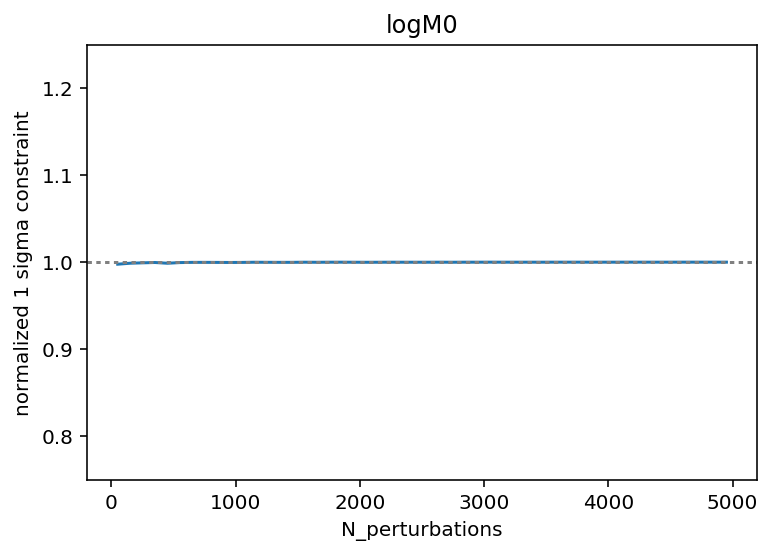

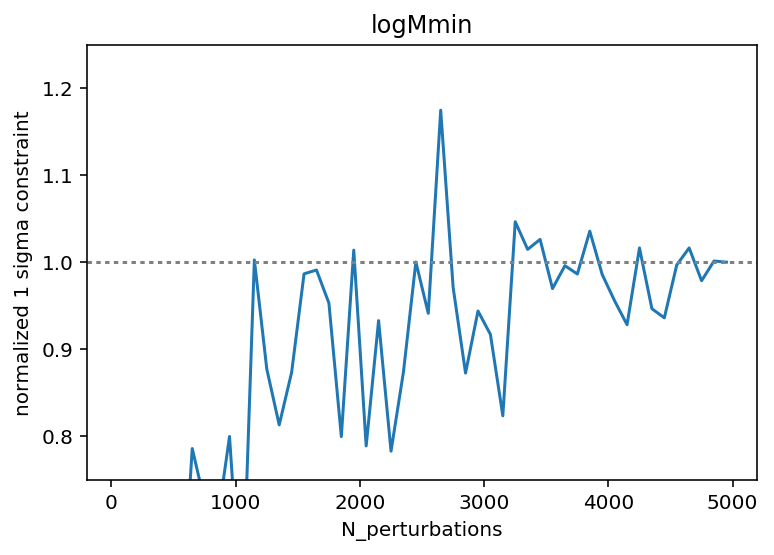

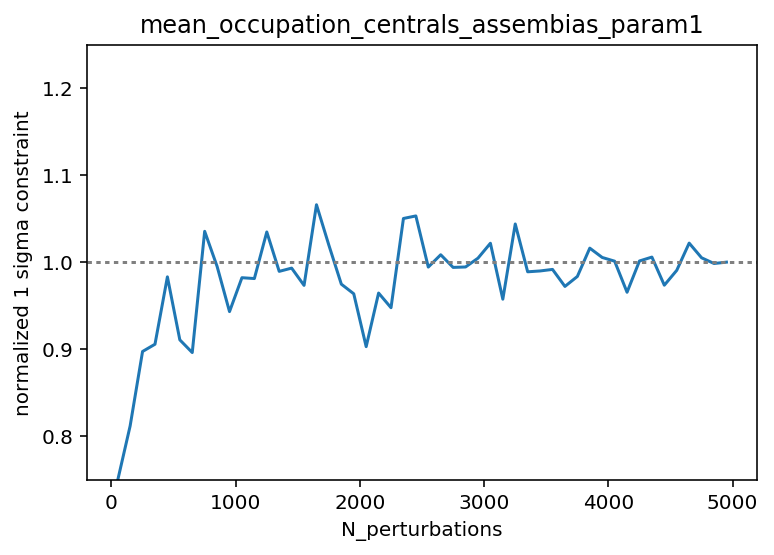

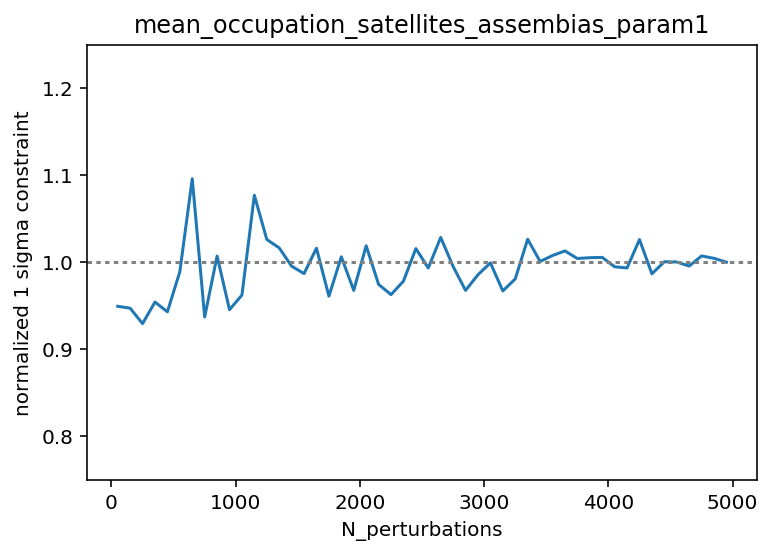

In [35]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('normalized 1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma_pp_ds[:,i]/one_sigma_pp_ds[-1,i])
    plt.axhline(1,linestyle=':',color='grey')
    plt.ylim((0.75,1.25))

In [36]:
one_sigma_pp_vpf = np.zeros((50,7))
for i in range(50):
    print i
    one_sigma_pp_vpf[i] = calc_1sigma_prior(calc_fisher(cutout_deriv[:,60:90,i*2+1],cov[60:90,60:90]),3,100)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


## vpf only

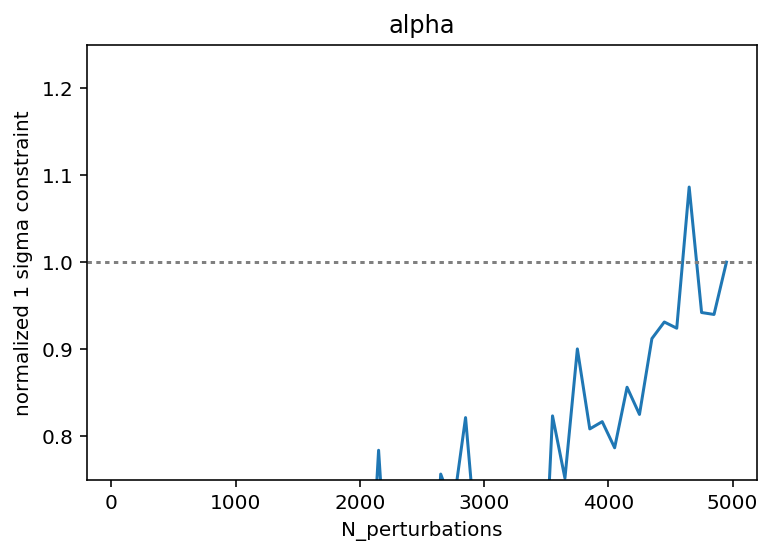

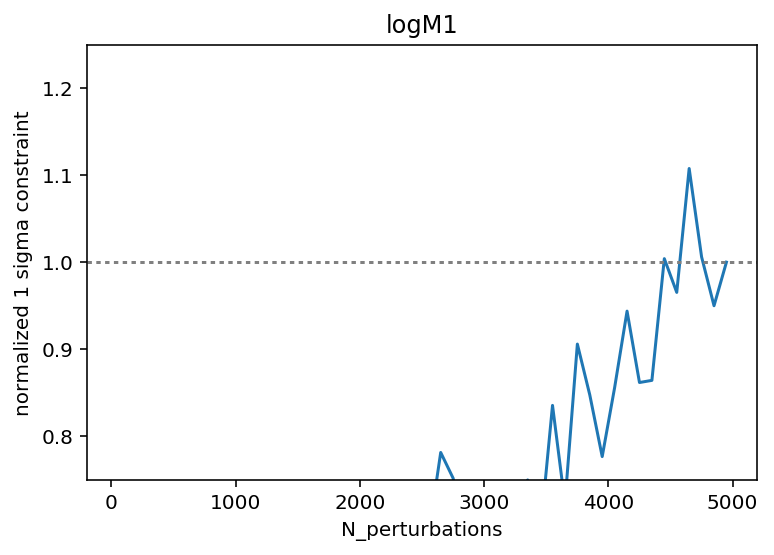

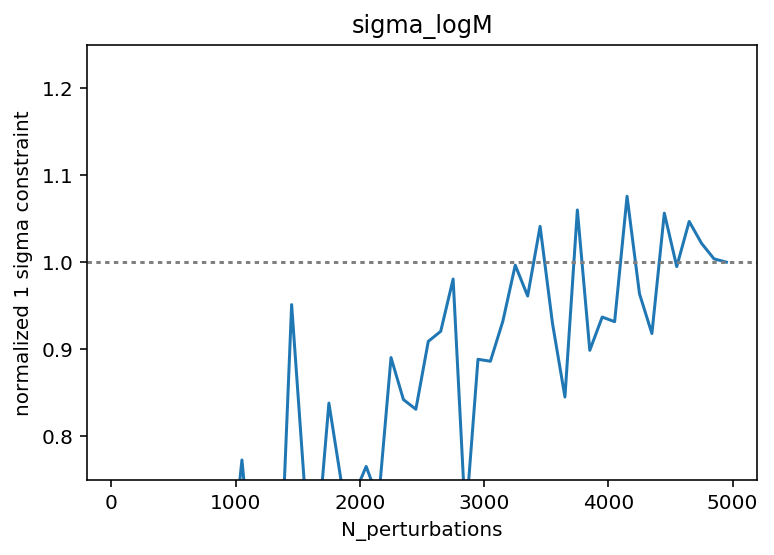

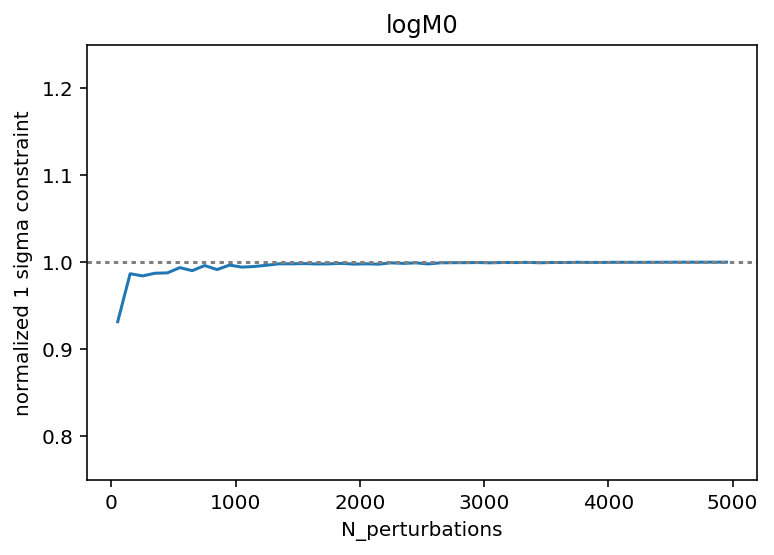

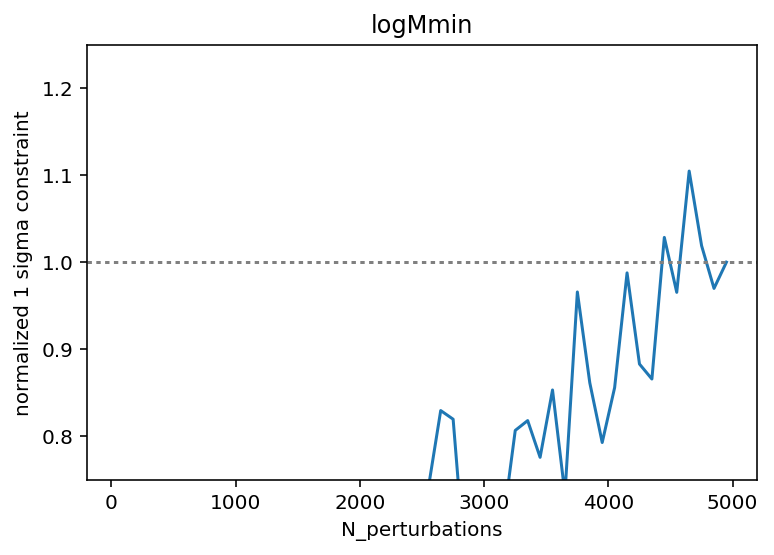

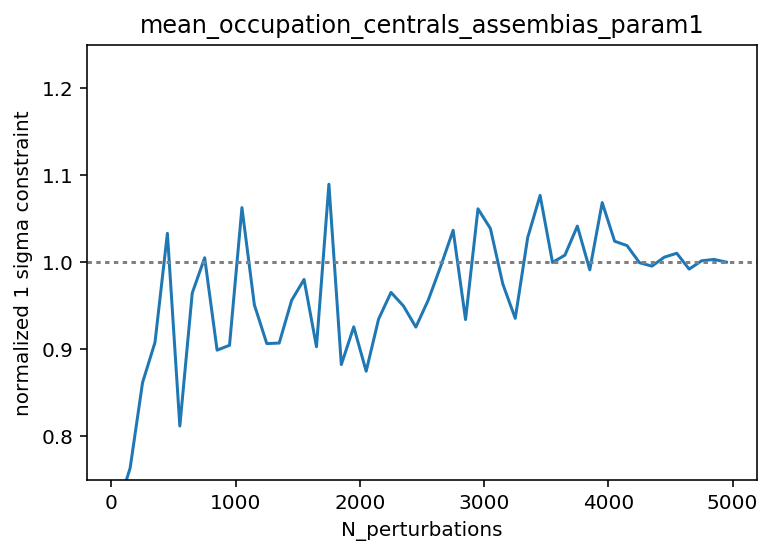

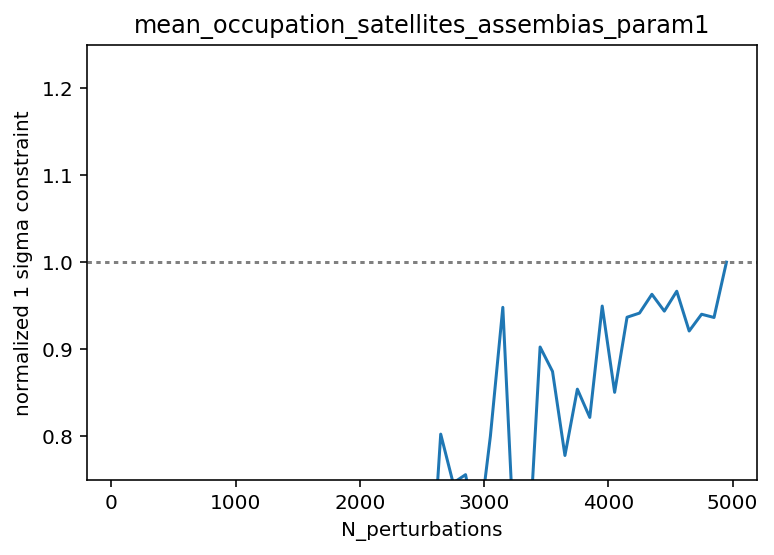

In [37]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('normalized 1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma_pp_vpf[:,i]/one_sigma_pp_vpf[-1,i])
    plt.axhline(1,linestyle=':',color='grey')
    plt.ylim((0.75,1.25))

In [38]:
one_sigma_pp_cic = np.zeros((50,7))
for i in range(50):
    print i
    one_sigma_pp_cic[i] = calc_1sigma_prior(calc_fisher(cutout_deriv[:,90:,i*2+1],cov[90:,90:]),3,100)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


## cic only

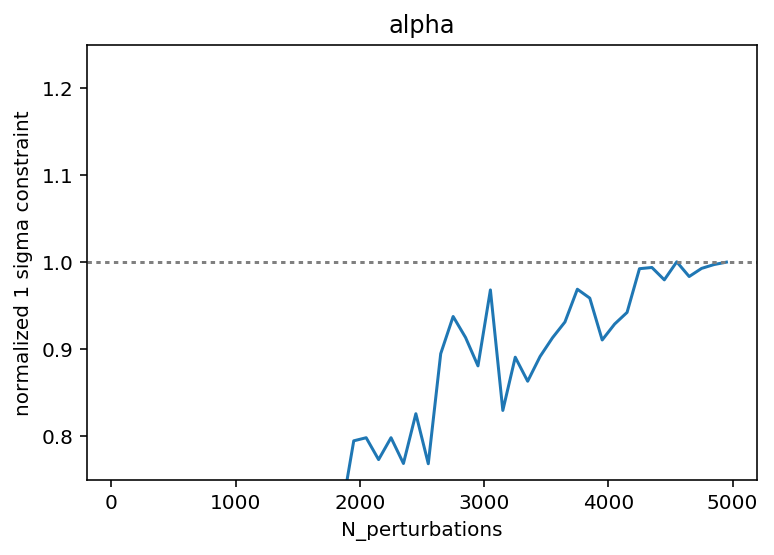

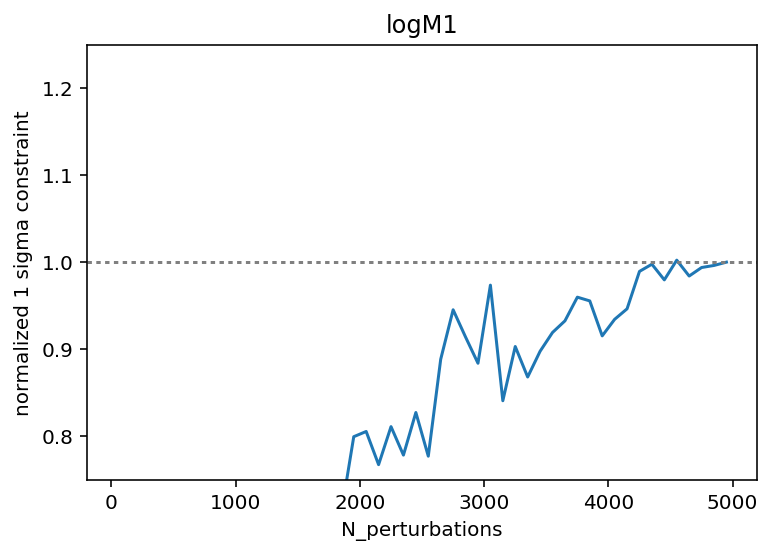

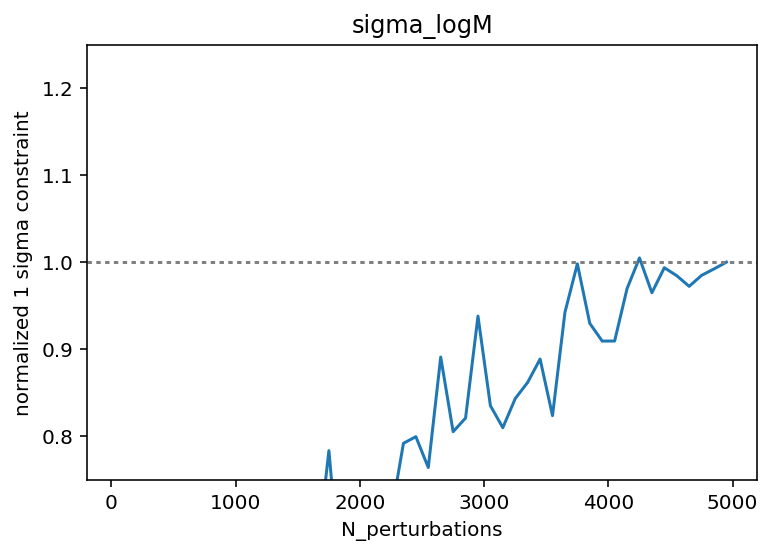

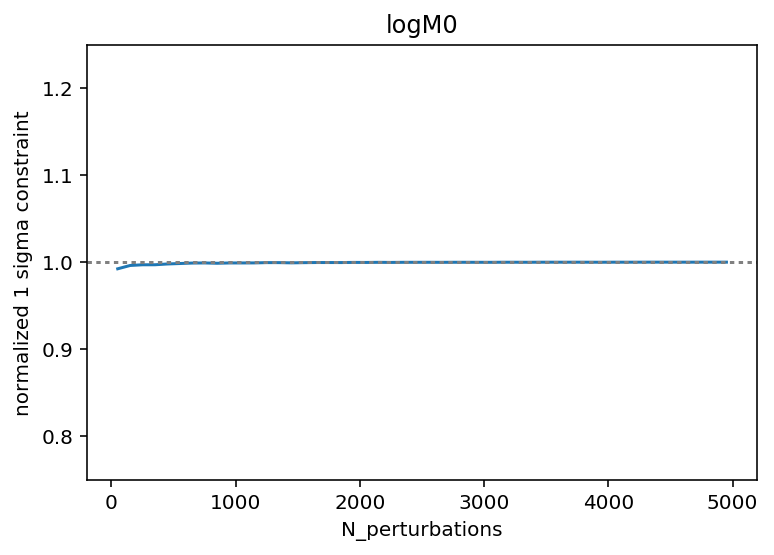

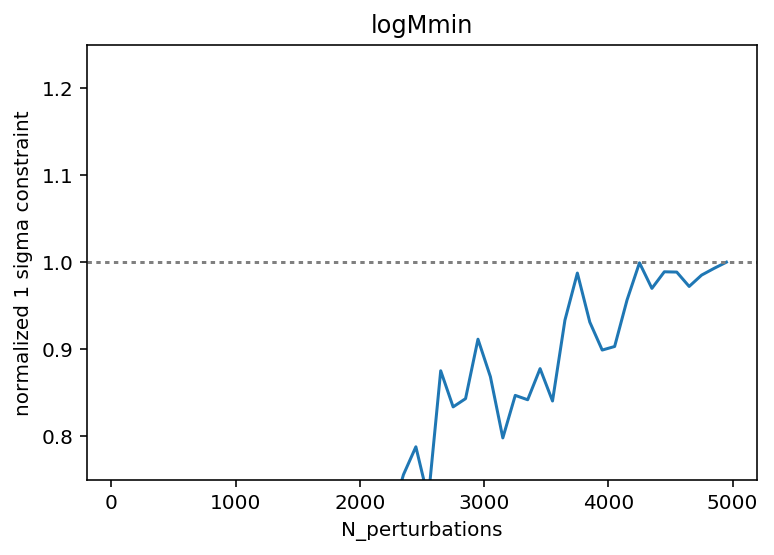

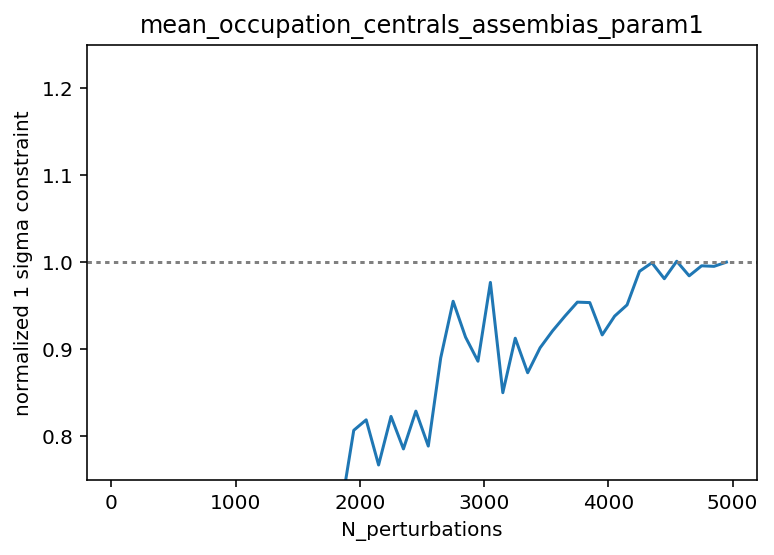

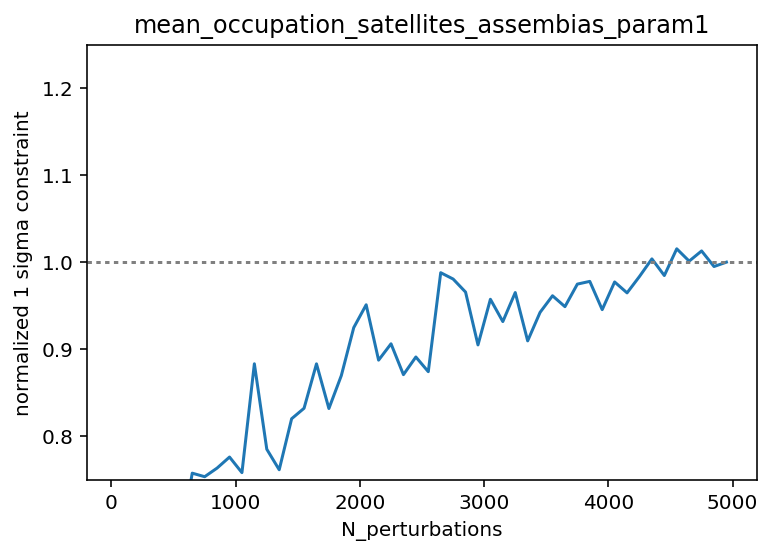

In [39]:
for i in range(7):
    plt.figure()
    plt.title(param_names[i])
    plt.xlabel('N_perturbations')
    plt.ylabel('normalized 1 sigma constraint')
    plt.plot(np.arange(50)*100+50,one_sigma_pp_cic[:,i]/one_sigma_pp_cic[-1,i])
    plt.axhline(1,linestyle=':',color='grey')
    plt.ylim((0.75,1.25))

In [40]:
suspects = np.array(((0,120),(2,155),(2,156),(2,157),(2,158),(2,159),\
         (3,97),(3,98),(3,134),(3,135),(3,136),(3,138),(3,139),\
         (3,141),(3,142),(3,143),(3,144),(3,145),(3,146),(3,147),\
         (3,148),(3,149),(3,150),(3,151),(3,152),(3,154),(3,155),\
         (3,156),(3,157),(3,158),(3,159),(5,0),(5,34),(5,37),(5,38),\
         (5,39),(5,40),(5,89),(5,106),(6,28),(6,29),(6,60),(6,61),\
         (6,62),(6,63),(6,64),(6,65),(6,66),(6,67),(6,68),(6,69),\
         (6,87),(6,88),(6,89),(6,101),(6,105),(6,106),(6,107),\
         (6,108),(6,109),(6,110),(6,137),(6,138),(6,139),(6,140),\
         (6,141),(6,142),(6,143),(6,145),(6,146),(6,147),(6,148),\
         (6,150),(6,151),(6,152),(6,153),(6,154),(6,155),(6,156),(6,157),(6,158)))

/home/kuw8/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


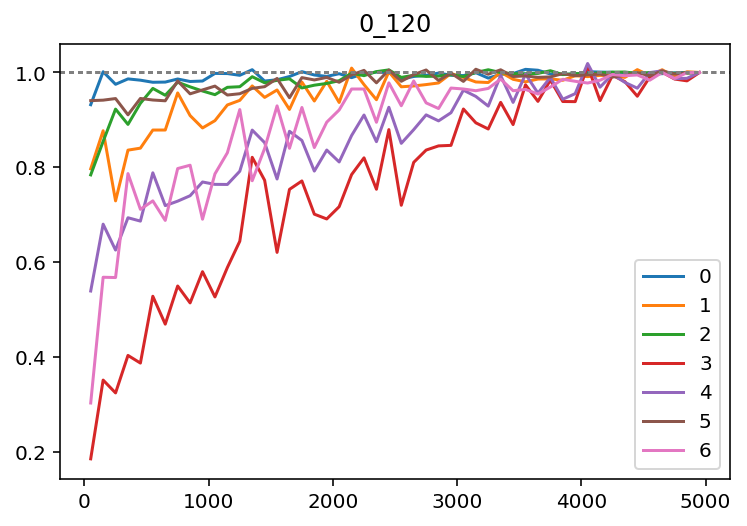

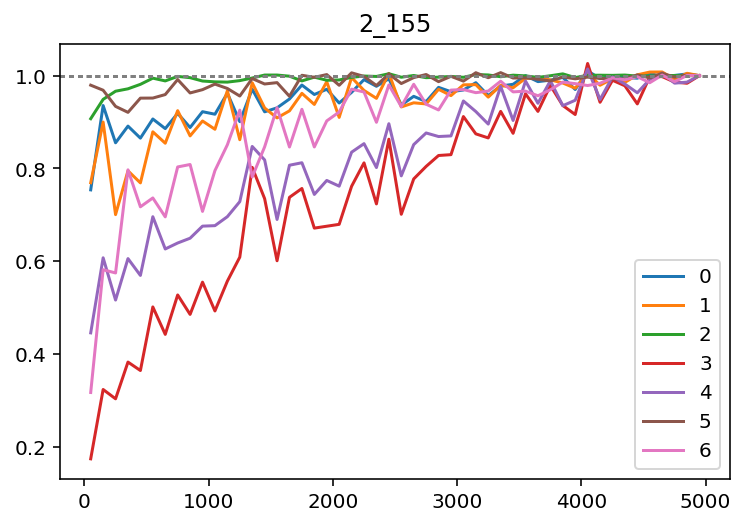

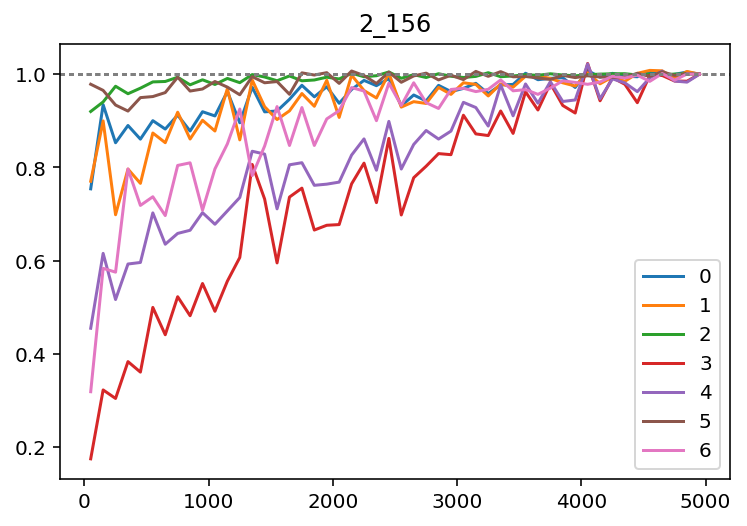

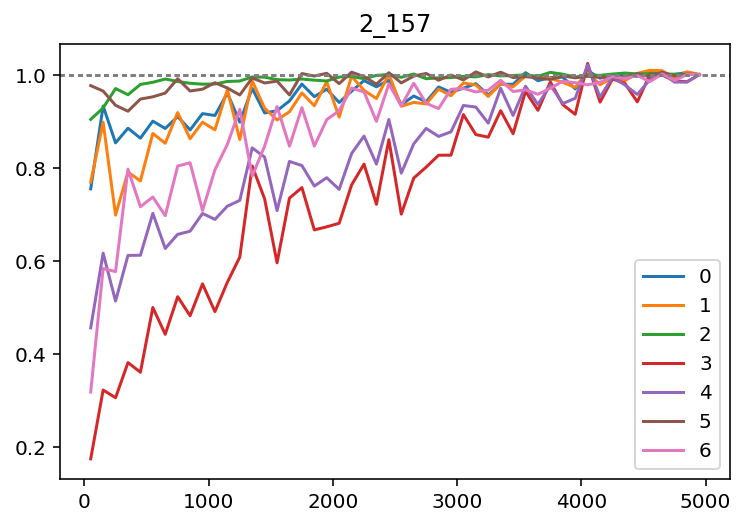

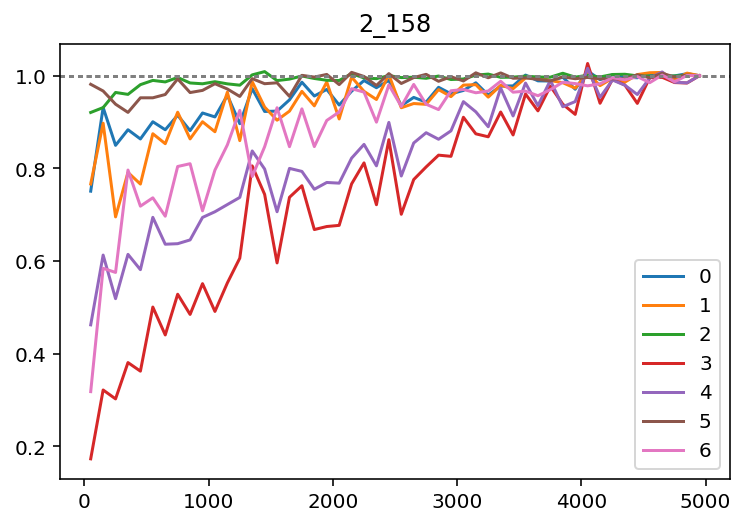

...

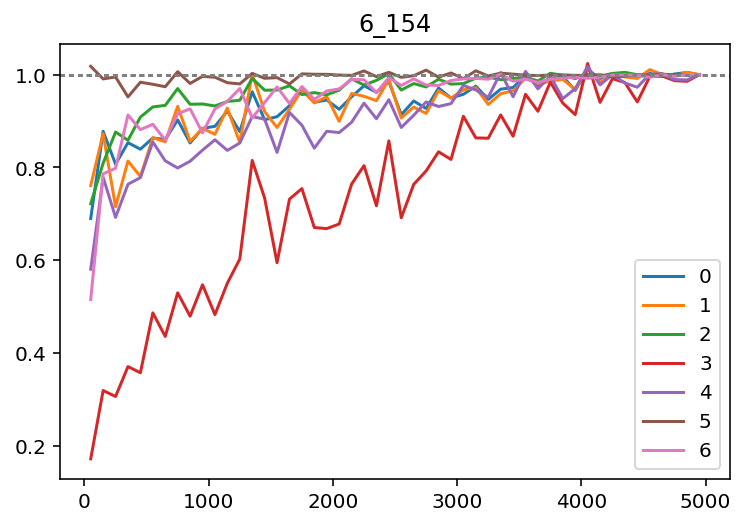

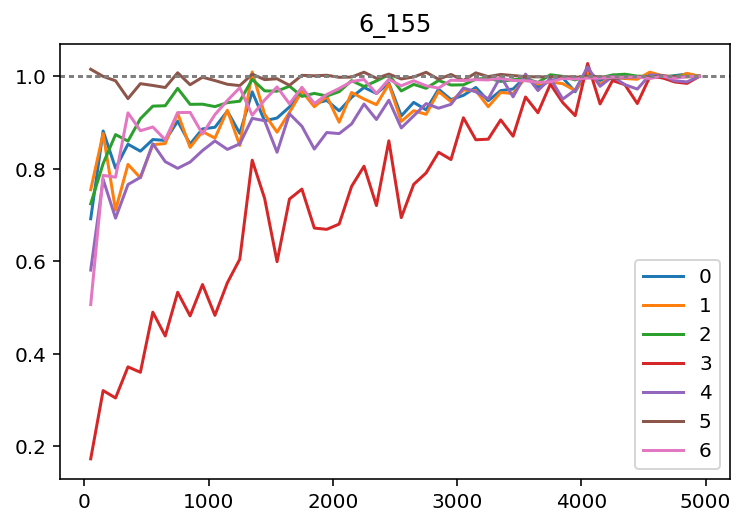

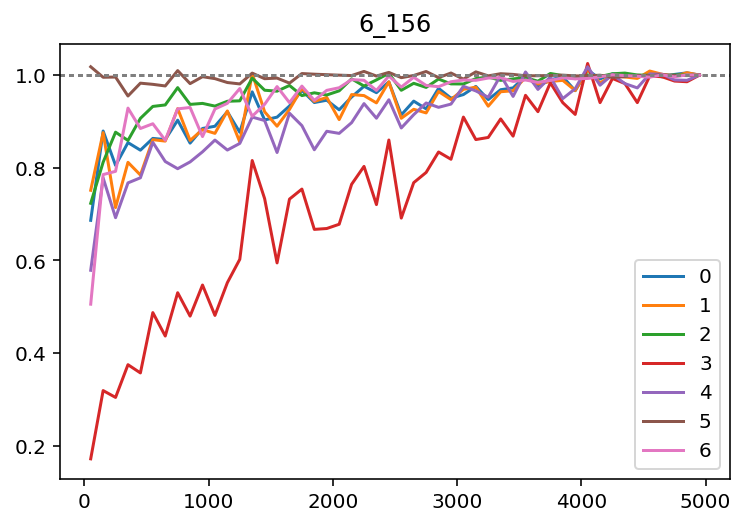

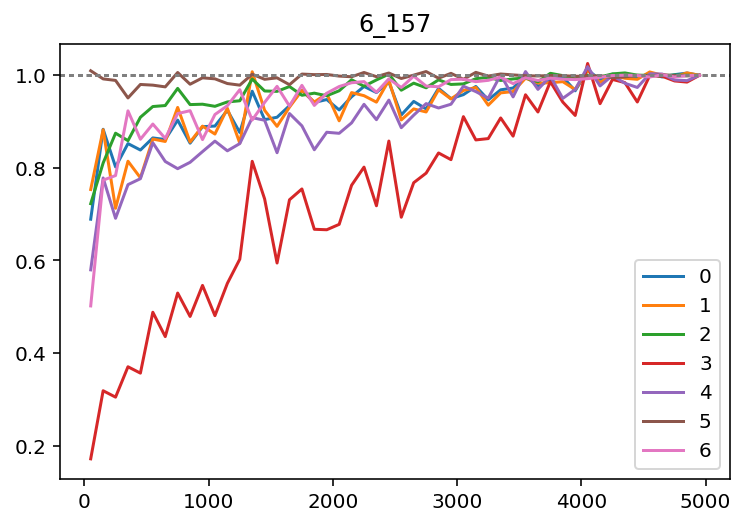

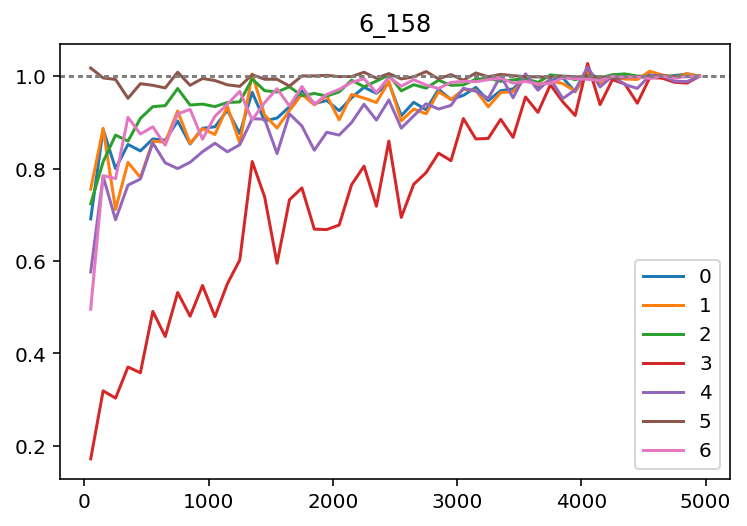

In [42]:
for i,j in suspects:
    one_sigma_ij = np.zeros((50,7))
    plt.figure()
    plt.title(str(i)+'_'+str(j))
    for k in range(50):
        deriv = 1.*cutout_deriv[:,:,k*2+1]
        deriv[i,j] = np.mean(fid_19p0['func_all'][:,j])/dp_range[i]
        one_sigma_ij[k] = calc_1sigma(calc_fisher(deriv,cov))
    for l in range(7):
        plt.plot(np.arange(50)*100+50,one_sigma_ij[:,l]/one_sigma_ij[-1,l],label = l)
        plt.legend()
        plt.axhline(1,linestyle=':',color='grey')